# Model Predictive Control (MPC) Tuning and Evaluation

**Goal of this notebook: to provide you with a starting point for the MPC part of the Upskilling assignment.**

The notebook uses the heading **Your turn** to indicate what parts of the notebook you should edit.

**You are allowed to, and are encouraged to, make large-scale changes to this notebook as part of completing the Upskilling assignment.**

Notebook map (see the table to contents for quick navigation to each of these sections):
1. **Environment configuration** defines the environment to be used through the notebook, and configure the road to be used during tuning.
2. **MPC formulation description** provides detailed equations and descriptions for the MPC policy class that is provided with the Gymnasium repository.
3. **Tune the MPC** is where you adjust the parameters of the MPC policy to build your experience and intuition for how the parameters influence the vehicle's driving behaviour.
4. ** Evaluation** is where you define multiple MPC policies, i.e., each with different paramters, define performance metrics, define uncertainty sweeps; and then run evaluation simulations and analyze the results.

**NOTE:** **"Tuning"** is essentially synonymous with **"synthesis"**. We use the word **"tuning"** is this notebook because you as the designer directly adjust the parameters of the MPC policy. By contrast, for RL we use the work **"synthesis"** because you as the designer adjust the parameters of the algorithm that trains the parameters of the RL policy, i.e., the policy synthesis algorithm.

**NOTE:** To help you "declutter" the navigation of this notebook, we encourage you to collapse the sections that you don't need to edit.

## Colab setup

* When running on **Colab**, this cell installs the pinned course package.
* When running **locally** on your computer, this cell does nothing.
  * To run this notebook **locally**, you need to install the following Python packages: `"scipy>=1.13.0,<2.0"`, `"osqp>=1.1.3,<2.0"`


In [49]:
import importlib
import os
from pathlib import Path
import site
import subprocess
import sys
import sysconfig

COURSE_SOURCE_REF = "v0.2.2"
COURSE_REPOSITORY = "https://gitlab.unimelb.edu.au/dream/dream-gym.git"
COLAB_CHECKOUT = Path("/content/dream-gym-current")
IS_COLAB = "google.colab" in sys.modules
package_was_loaded = any(
    name == "dreamgym" or name.startswith("dreamgym.")
    for name in sys.modules
)
setup_diagnostic = None

if IS_COLAB:
    if package_was_loaded:
        setup_diagnostic = "restart the Colab runtime before continuing"
    else:
        try:
            if COLAB_CHECKOUT.exists():
                if not (COLAB_CHECKOUT / ".git").is_dir():
                    raise RuntimeError("unverifiable checkout")
                origin = subprocess.run(
                    ("git", "-C", str(COLAB_CHECKOUT), "remote", "get-url", "origin"),
                    capture_output=True, text=True, check=True,
                ).stdout.strip()
                if origin != COURSE_REPOSITORY:
                    raise RuntimeError("unexpected checkout origin")
                status = subprocess.run(
                    ("git", "-C", str(COLAB_CHECKOUT), "status", "--porcelain"),
                    capture_output=True, text=True, check=True,
                ).stdout.strip()
                if status:
                    raise RuntimeError("checkout has local changes")
                subprocess.run(
                    ("git", "-C", str(COLAB_CHECKOUT), "fetch", "--depth", "1", "origin", COURSE_SOURCE_REF),
                    capture_output=True, text=True, check=True,
                )
                subprocess.run(
                    ("git", "-C", str(COLAB_CHECKOUT), "checkout", "--detach", "FETCH_HEAD"),
                    capture_output=True, text=True, check=True,
                )
            else:
                subprocess.run(
                    ("git", "clone", "--branch", COURSE_SOURCE_REF, "--single-branch", COURSE_REPOSITORY, str(COLAB_CHECKOUT)),
                    capture_output=True, text=True, check=True,
                )
            subprocess.run(
                (sys.executable, "-m", "pip", "install", "-e", ".[mpc]"),
                cwd=COLAB_CHECKOUT, capture_output=True, text=True, check=True,
            )
            site.addsitedir(sysconfig.get_paths()["purelib"])
            os.chdir(COLAB_CHECKOUT)
            importlib.invalidate_caches()
        except (OSError, RuntimeError, subprocess.CalledProcessError):
            setup_diagnostic = "notebook setup failed"

if setup_diagnostic is not None:
    print(setup_diagnostic)


In [50]:
if setup_diagnostic is not None:
    raise RuntimeError(
        f"Notebook setup did not complete: {setup_diagnostic}"
    )


## Execution mode

The following code cell defines the two executions modes of the notebooks:
* `smoke` is a quick run to check everything is working, which in the case of this notebook is smaller prediction horizon, roll-out length, uncertainty sweeps, animation size.
* `full` is the run with larger values for all those things listed above.

`OUTPUT_ROOT` is relative to the execution location of this notebook and all generated artifacts stay below it.

| Property | Units | Allowed values | Default or inheritance | Reason |
| --- | --- | --- | --- | --- |
| `RUN_MODE` | unitless | `smoke` or `full` | default `smoke`; no inheritance | Separates a short path check from explicit long acceptance. |
| `OUTPUT_ROOT` | repository-relative path | `notebook_outputs/mpc-tuning-and-evaluation/` | derived from the selected activity; no inheritance | Contains generated artifacts in the ignored notebook-output root. |
| `MODE.animation_frame_step` | transitions/frame | smoke `2`; full `4` | selected by `RUN_MODE`; no inheritance | Thins later prediction-history animation frames. |

Mode paramters for sweep steps and sweep samples are defined in the Evaluation section of this notebook.

The Gymnasium repository contains:
* [MPC documentation](https://gitlab.unimelb.edu.au/dream/dream-gym/-/blob/v0.2.2/docs/mpc.md) that describes the details of the MPC policy. The most relevant details are also given in this notebook.
* [Evaluation Utilities documentation](https://gitlab.unimelb.edu.au/dream/dream-gym/-/blob/v0.2.2/docs/evaluation_utilities.md) that describes the function for running simulations and collecting rollout data.


In [51]:
RUN_MODE = "full"
if RUN_MODE not in {"smoke", "full"}:
    raise ValueError("RUN_MODE must be 'smoke' or 'full'")
OUTPUT_ROOT = Path("notebook_outputs") / "mpc-tuning-and-evaluation"
OUTPUT_ROOT.mkdir(parents=True, exist_ok=True)
MODE = {
    "smoke": {
        "animation_frame_step": 10,
    },
    "full": {
        "animation_frame_step": 2,
    },
}[RUN_MODE]


## Imports

In [52]:
import dreamgym
dreamgym_source = Path(dreamgym.__file__).resolve()
if IS_COLAB and not dreamgym_source.is_relative_to(COLAB_CHECKOUT.resolve()):
    raise RuntimeError("Dream Gym resolved outside the selected Colab checkout")

import copy
import dataclasses
import gymnasium as gym
import numpy as np
import matplotlib.pyplot as plt
from IPython.display import HTML, display
from dreamgym.envs import Road
from dreamgym.evaluation import (
    MetricSet,
    PerformanceMetric,
    PolicySpec,
    compute_pareto_front,
    save_metric_tables,
)
from dreamgym.evaluation.autonomous_driving import (
    AutonomousDrivingEvaluationConfig,
    InitialStateValueParameter,
    UniformMultiplierParameter,
    UncertaintySweep,
    evaluate_policies_over_sweep,
    metric_by_name,
    rerun_mpc_sweep_rollout,
    simulate_mpc_policy,
)
from dreamgym.policies.autonomous_driving import (
    AutonomousDrivingSteeringRateMPCConfig,
    AutonomousDrivingSteeringRateMPCPolicy,
    KinematicBicycleMPCModelConfig,
    MPCFallbackConfig,
    MPCFallbackMode,
    SteeringRateMPCConstraintConfig,
    SteeringRateMPCObjectiveConfig,
)
from dreamgym.policies.mpc import MPCSolverConfig
from dreamgym.visualization.autonomous_driving import (
    plot_simulation_results,
    animate_mpc_prediction_history,
    animate_mpc_world_prediction_history,
    plot_mpc_controller_outcomes,
    plot_mpc_fixed_lead_predictions,
    plot_mpc_prediction_at_transition,
    plot_mpc_prediction_horizon_fan,
    plot_mpc_solver_health,
    save_figure,
    save_road_plot,
)

## 1. Environment configuration

The following cells specify the vehicle parameters, observations, and tuning road elements. The final cell in this section makes the Gymnasium environment object to be used for tuning.

You should edit only the road elements in the **Tuning Road** cell. A separate **Evaluation Road** later in the notebook ensures that tuning and evaluation do not reuse the same road.

If you want to look up more details about any of the fields in this section, the relevant documentation in the Gymnasium repository are:
* [Observation documentation](https://gitlab.unimelb.edu.au/dream/dream-gym/-/blob/v0.2.2/docs/observations.md)
* [Bicycle model documentation](https://gitlab.unimelb.edu.au/dream/dream-gym/-/blob/v0.2.2/docs/ad_gym.md)
* [Road documentation](https://gitlab.unimelb.edu.au/dream/dream-gym/-/blob/v0.2.2/docs/road.md)
* [MPC documentation](https://gitlab.unimelb.edu.au/dream/dream-gym/-/blob/v0.2.2/docs/mpc.md)

### Observations and vehicle model

In [53]:
MPC_OBSERVATION_NAMES = (
    "body_longitudinal_velocity_mps",
    "front_wheel_steering_angle_rad",
    "lateral_error_from_target_line_m",
    "heading_error_from_target_line_rad",
    "recommended_speed_mps",
    "next_recommended_speed_change_value_mps",
    "next_recommended_speed_change_reference_line_distance_m",
)
mpc_common_environment_kwargs = {
    "render_mode": None,
    "bicycle_model_config": {
        "axle_geometry": {
            "front_axle_distance_from_center_of_mass_m": 0.55 * 2.875,
            "rear_axle_distance_from_center_of_mass_m": 0.45 * 2.875,
        },
        "mass_properties": {
            "mass_kg": 2000.0,
            "yaw_moment_of_inertia_kg_m2": (1.0 / 12.0) * 2000.0 * (4.692 ** 2 + 1.850 ** 2),
        },
        "longitudinal_force_model": {
            "normalized_motor_command_force_gain_n": (400.0 * 9.0) / 0.2286,
            "quadratic_aerodynamic_drag_coefficient_kg_per_m": (0.5 * 0.24 * 2.2204 * 1.202),
        },
        "steering": {
            "physical_front_wheel_angle_offset_from_request_rad": np.deg2rad(2.0),
            "requested_front_wheel_angle_magnitude_limit_rad": np.deg2rad(45.0),
            "physical_front_wheel_angle_rate_bounds_rad_per_s": {
                "lower": np.deg2rad(-45.0),
                "upper": np.deg2rad( 45.0),
            },
        },
        "kinematic_dynamic_transition": {
            "body_longitudinal_speed_range_mps": {"lower": 500.0 / 3.6, "upper": 600.0 / 3.6},
        },
    },
    "integration_config": {
        "method": "rk4",
        "environment_step_duration_s": 0.05,
        "substep_count": 1,
    },
    "termination_config": {},
    "initial_state_config": {
        "bounds": {
            "world_pose": {
                "x_m": {"lower": 0.0, "upper": 0.0},
                "y_m": {"lower": 0.4, "upper": 0.5},
                "heading_rad": {"lower": 0.0, "upper": 0.0},
            },
            "body_motion": {
                "longitudinal_velocity_mps": {"lower": 80.0 / 3.6, "upper": 80.0 / 3.6},
                "lateral_velocity_mps": {"lower": 0.0, "upper": 0.0},
                "yaw_rate_rad_per_s": {"lower": 0.0, "upper": 0.0},
            },
            "front_wheel_steering_angle_rad": {"lower": 0.0, "upper": 0.0},
        },
        "reference_line_progress_search": {"lower_bound_m": 0.0, "upper_bound_m": 0.0},
    },
    "observation_config": {
        "body_longitudinal_velocity_mps": {"destination": "observation", "scaling_factor": 1.0},
        "front_wheel_steering_angle_rad": {"destination": "observation", "scaling_factor": 1.0},
        "lateral_error_from_target_line_m": {"destination": "observation", "scaling_factor": 1.0},
        "heading_error_from_target_line_rad": {"destination": "observation", "scaling_factor": 1.0},
        "recommended_speed_mps": {"destination": "observation", "scaling_factor": 1.0},
        "next_recommended_speed_change": {
            "value_mps": {"destination": "observation", "scaling_factor": 1.0},
            "reference_line_distance_m": {"destination": "observation", "scaling_factor": 1.0},
        },
    },
    "target_line_config": {"mode": "reference_line"},
    "internal_policy_config": {
        "lane_keeping": {"enabled": False},
        "cruise_control": {"enabled": False},
        "action_interface": "full",
    },
    "ground_truth_mode": "operational",
    "observation_format": "dict",
}


### Tuning road specification

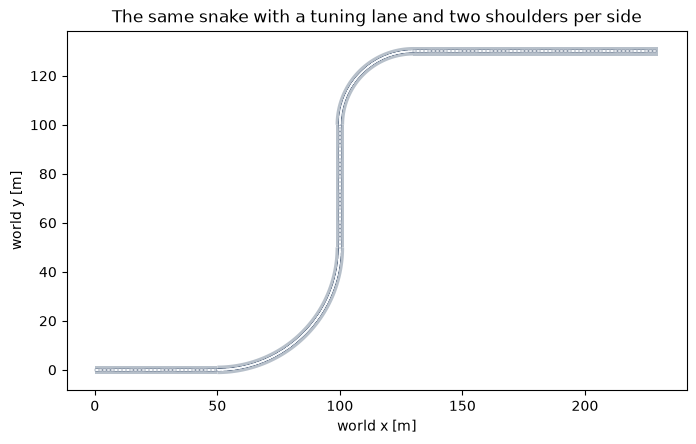

WindowsPath('notebook_outputs/mpc-tuning-and-evaluation/ad_road_tuning-road.png')

In [54]:
MPC_TUNING_ROAD_ELEMENTS = (
    {
        "geometry": {"type": "straight", "length_m": 50.0},
        "speed_limit_kph": 80.0,
        "lanes": {
            "reference_line_role": "lane_center",
            "reference_lane": {"width_m": {"start": 3.5, "end": 3.5}},
        },
    },
    {
        "geometry": {
            "type": "circular_arc",
            "curvature_per_m": 1.0 / 50.0,
            "sweep_angle_deg": 90.0,
        },
        "speed_limit_kph": 80.0,
    },
    {"geometry": {"type": "straight", "length_m": 50.0}, "speed_limit_kph": 80.0},
    {
        "geometry": {
            "type": "circular_arc",
            "curvature_per_m": -1.0 / 30.0,
            "sweep_angle_deg": 90.0,
        },
        "speed_limit_kph": 80.0,
    },
    {"geometry": {"type": "straight", "length_m": 100.0}, "speed_limit_kph": 80.0},
)

MPC_ROAD_DEFAULTS = {
    "reference_line_role": "lane_center",
    "cross_section_width_interpolation": "constant",
    "lane": {
        "travel_direction": "increasing_reference_progress",
        "surface": "tarmac",
        "is_available": True,
        "is_drivable": True,
    },
}

def build_mpc_road_spec(elements):
    return {
        "defaults": copy.deepcopy(MPC_ROAD_DEFAULTS),
        "elements": copy.deepcopy(list(elements)),
    }

MPC_TUNING_ROAD_SPEC = build_mpc_road_spec(MPC_TUNING_ROAD_ELEMENTS)
mpc_tuning_road = Road(road_spec=MPC_TUNING_ROAD_SPEC)

# Plot the road
tuning_road_figure, tuning_road_axis = plt.subplots(figsize=(8.0, 5.0))
tuning_road_plot_handles = mpc_tuning_road.plot_road_on_matplotlib_axis(tuning_road_axis)
tuning_road_axis.set_title("The same snake with a tuning lane and two shoulders per side")
tuning_road_axis.set_xlabel("world x [m]")
tuning_road_axis.set_ylabel("world y [m]")
tuning_road_axis.set_aspect("equal", adjustable="box")
try:
    display(tuning_road_figure)
    tuning_road_plot_path = save_road_plot(
        tuning_road_figure,
        OUTPUT_ROOT,
        file_name_suffix="tuning-road",
        file_format="png",
    )
finally:
    plt.close(tuning_road_figure)
tuning_road_plot_path



### Your turn

Add, remove, and/or edit the roads elements in `MPC_TUNING_ROAD_ELEMENTS` above to specify the road you want to use during tuning. A "good" tuning road includes a handfil of "driving scenarios" without being an excessive long road. By scenarios we mean things like:
* A high-speed straight followed by a sharp turn.
* A straight with a significant reduction in speed.
* A sharp turn one direction followed immediately by a sharp turn in the other direction.
* and more...

### Make the tuning environment

In [55]:
if "road_spec" in mpc_common_environment_kwargs:
    raise RuntimeError("the MPC common environment mapping must omit the Road")
mpc_tuning_environment_kwargs = copy.deepcopy(mpc_common_environment_kwargs)
mpc_tuning_environment_kwargs["road_spec"] = copy.deepcopy(
    mpc_tuning_road.requested_road_spec
)
env = gym.make(
    "dreamgym/autonomous_driving_env",
    **copy.deepcopy(mpc_tuning_environment_kwargs),
)

## 2. MPC Formulation Description

It is recommended that you read this whole section and ask any questions you have about the following descriptions of the generic MPC class and the autonomous driving MPC class.

### **Generic MPC Class**

The `dream-gym` repository provides a class named `LinearQuadraticMPCSolver`. The MPC optimization program that this class implements is the following:

$$
\begin{align}
\min_{s_{0},a_{0},\dots,s_{N-1},a_{N-1},s_{N}}
&\hspace{0.5cm}
\sum_{k=0}^{N} \left( (s_{k}-s_{ref,k})^T Q_k (s_{k}-s_{ref,k}) + (a_{k}-a_{ref,k})^T R_k (a_{k}-a_{ref,k}) \right)
\\
&\hspace{0.5cm}
+ (s_{N}-s_{ref,N})^T Q_{N} (s_{N}-s_{ref,N})
\\
&\hspace{0.5cm}
+ \sum_{k=0}^{N} \left( q_k^T s_{k} + r_k^T a_{k} \right)
\\
\text{s.t.} &\hspace{0.5cm}
s_{0} = \hat{s}(t_{\text{current}})
\\
&\hspace{0.5cm}
s_{k+1} = A_k s_{k} + B_k a_{k}, \hspace{2.0cm} \text{for } k=0,\dots,N-1
\\
&\hspace{0.5cm}
l_{a,k} \leq a_{k} \leq u_{a,k}, \hspace{3.1cm} \text{for } k=0,\dots,N-1
\\
&\hspace{0.5cm}
l_{s,k} \leq s_{k} \leq u_{s,k}, \hspace{3.2cm} \text{for } k=0,\dots,N
\\
&\hspace{0.5cm}
l_{\Delta a,k} \leq a_{k} - a_{k-1} \leq u_{\Delta a,k}, \hspace{1.0cm} \text{for } k=1,\dots,N-1
\\
&\hspace{0.5cm}
l_{\Delta a,0} \leq a_{0} - a_{\text{previous}} \leq u_{\Delta a,0},
\end{align}
$$

Where the notation is defined as:

* $N \in \mathbb{Z}$ is the prediction horizon
* $n_s \in \mathbb{Z}$ is the size of the state vector, i.e., $s_k \in \mathbb{R}^{n_s}$
* $n_a \in \mathbb{Z}$ is the size of the action vector, i.e., $a_k \in \mathbb{R}^{n_a}$
* $s_{ref,k} \in \mathbb{R}^{n_s}$ is the reference value for the state at time step $k$
* $a_{ref,k} \in \mathbb{R}^{n_a}$ is the reference value for the action at time step $k$
* $Q \in \mathbb{R}^{n_s \times n_s}$ is the quadratic coefficent for the state objective function
* $R \in \mathbb{R}^{n_a \times n_a}$ is the quadratic coefficent for the action objective function
* $P_{N} \in \mathbb{R}^{n_s \times n_s}$ is the quadratic coefficent for the terminal objective function on the state
* $A \in \mathbb{R}^{n_s \times n_s}$ is the linear coefficient of the state part of the dynamics function
* $B \in \mathbb{R}^{n_s \times n_a}$ is the linear coefficient of the action part of the dynamics function
* $l_{a,k},\, u_{a,k} \in \mathbb{R}^{n_a}$ are the lower and upper bounds respectively on the action at time step $k$
* $l_{s,k},\, u_{s,k} \in \mathbb{R}^{n_s}$ are the lower and upper bounds respectively on the state at time step $k$
* $l_{\Delta a,k},\, u_{\Delta a,k} \in \mathbb{R}^{n_a}$ are the lower and upper bounds respectively on the change of action between two time steps $k-1$ to $k$

### **MPC Policy Class for cruise control and lane keeping combined**

At each control step, this steering-rate MPC solves a finite-horizon **minimization** and then applies only the first requested action before solving again. This receding horizon feedback is a repeated re-solve, not an open-loop execution of the whole prediction. The implementation does not warm-start the numerical solver.

The controller state is `[speed, lateral error, heading error, steering angle]` in `[m/s, m, rad, rad]`. Its control is `[normalized drive command, physical steering rate]` in `[1, rad/s]`; normalized drive is dimensionless and is not a percentage. A horizon of `N` intervals therefore has **N + 1 states** and **N controls**.

#### **Notation**:
The symbols for defining the bicycle model are:

**States:**
* $v_{x,k}$ Velocity of the car in the direction of the body frame x-axis at time-step k, i.e., this is the velocity at the rear-wheels. (units: meters per seconds)

* $d_k$ Closest distance from the car's Cartesian position to the line-to-follow at time-step k, i.e., this distance is measured orthogonal to the line-to-follow. A positive value means the car is on the right-hand-side of the road relative to the direction of increasing progress, and a negative value means the left-hand-side. (units: meters)

* $\mu_k$ Heading angles of the car relative to the tangent direction of the line-to-follow at the closet point at time-step k, i.e., the angle from the tangent line to the body-frame x-axis. (units: radians)

**Actions:**
* $F_{\mathrm{cmd},k}$ Drive force command in percent applied to the rear wheels at time-step k, where negative means a force in the reverse direction. (units: percent)

* $\delta_k$ Requested steering angle of the front wheels, relative to the body-frame x-axis, at time-step k. (units: radians)

**Model Parameters:**
* $T_s$ Duration between two subsequent discrete time-step, i.e., sample time for time-discretization. (units: seconds)

* $L_f$ The length from the center-of-gravity to the center of the front wheel. (units: meters)

* $L_r$ The length from the center-of-gravity to the center of the rear wheel. (units: meters)

* $m$ The mass of the vehicle. (units: kilograms)

* $C_m$ The motor constant that converts the drive command to force applied to the wheel. (units: Newtons per "100% command")

**Linearization "point":**
* $\bar{v}_x$ Velocity of the car in the direction of the body frame x-axis **about which the model is linearized** (units: meters per second)

<br>


#### **Important note for steering action**:

As listed in the notation above, the steering action into the gymnasium is a **requested** steering angle. The gymnasium limits the rate-of-change of steering angle. Specifially, the step function:

* Checks what steering rate-of-change is needed to reach the requested steering angle at the start of the next time step, i.e., over time interval `Ts`.

* If this steering rate is greater than the maximum specified for the bicycle model (i.e., the `Ddelta_lower_bound` and `Ddelta_upper_bound` parameters), then the gynamasium limits to the maximum steering rate-of-change.

* The gynasium model the steering angle as a contant rate-of-change betweem the steering angles of any two time steps.

<br>

**Hence**, for an MPC lane-keeping policy, we should include this behaviour in the model to get more accurate predictions. This mean that:

* Within the MPC optmization program, the rate-of-change of steering is the steering-type actions at each time step.
* The actual steering angle of the car becomes a state in the model of the MPC optimization program, hence we need an observation of the actual steering angle.
* We compute the "requested steering angle" action for the gynasium as the first steering rate action from MPC multipled by the sample time, ie.: `a0 * Ts`.

<br>


#### **Linear system model:**

The following is available as documention for the kinematic bicycle model of a car:
* The model documentation provide on the [Workshop Material page on LMS](https://canvas.lms.unimelb.edu.au/courses/238681/pages/workshop-materials-2026-sm2) provides a derivation of the non-linear kinematic bicycle model for a car.
* The [documentation page in the git repository](https://gitlab.unimelb.edu.au/dream/dream-gym/-/blob/main/docs/ad_gym.md) provides the linearization of the kinematic bicycle model.


<br>

**For the velocity of the bicycle mode:**

The continuous-time model is:
$$
\frac{d}{dt} \, v
\,=\,
\left(\frac{1}{m} \, \frac{C_m}{100.0}\right)
\,
F_{\mathrm{cmd},k}
$$

And hence the discrete-time model is:
$$
v_{x,k+1}
\,=\,
v_{x,k}
\,+\,
\left(T_s \, \frac{1}{m} \, \frac{C_m}{100.0}\right)
\,
F_{\mathrm{cmd},k}
$$

<br>

**For the lane-position and heading angle of the bicycle mode:**

With steering rate as the action, the continuous-time model is:
$$
\begin{align}
\begin{bmatrix} \frac{d}{dt} \, d \\ \frac{d}{dt} \, \mu \\ \frac{d}{dt} \, \delta \end{bmatrix}
&\,=\,
\begin{bmatrix}
    0 & \bar{v}_x & 0
    \\
    0 & 0 & \bar{v}_x \, \frac{1}{L_r+L_f}
    \\
    0 & 0 & 0
\end{bmatrix}
\,
\begin{bmatrix} d_k \\ \mu_k \\ \delta \end{bmatrix}
\,+\,
\begin{bmatrix}
    0
    \\
    0
    \\
    1
\end{bmatrix}
\,
\begin{bmatrix} \dot{\delta} \end{bmatrix}
\end{align}
$$



And hence the discrete-time model is:
$$
\begin{align}
\begin{bmatrix} d_{k+1} \\ \mu_{k+1} \\ \delta_{k+1} \end{bmatrix}
&\,=\,
\begin{bmatrix}
    1 & T_s \, \bar{v}_x & \frac{1}{2} \, T_s^2 \, \bar{v}_x^2 \, \frac{1}{L_r+L_f}
    \\
    0 & 1 & T_s \, \bar{v}_x \, \frac{1}{L_r+L_f}
    \\
    0 & 0 & 1
\end{bmatrix}
\,
\begin{bmatrix} d_k \\ \mu_k \end{bmatrix}
\,+\,
\begin{bmatrix}
    \frac{1}{6} \, T_s^3 \, \bar{v}_x^2 \, \frac{1}{L_r+L_f}
    \\
    \frac{1}{2} \, T_s^2 \, \bar{v}_x \, \frac{1}{L_r+L_f}
    \\
    T_s
\end{bmatrix}
\,
\begin{bmatrix} \dot{\delta}_k \end{bmatrix}
\end{align}
$$

<br>

The two most important insights from these models are:

* The $\bar{v}_x$ linearization velocity appears in the model for lane-devaition and heading-angle.
  * Hence, the sensitivity of these states depends on the speed of the bicycle, which makes intutitive sense.
  * Hence, we need to update the model every time speed of the bicycle changes "significantly" (and we really should use a different model at every step of the time horizon!).

* The model for the veloicity is completely separate from the model for lane-deviation and heading-angle.
  * Hence, The policies can be designed separately from each other (with the caveat of the $\bar{v}_x$ connection described above).
  * We anyway choose to have one combined model for velocity, lane-keeping, and heading-angle because it is convenient.

<br>

Hence, the model that we use is (where the underbraces are for the standard linear system model notation of $s_{k+1}=As_{k}+Ba_{k}$):
$$
\begin{align}
\underbrace{\begin{bmatrix} v_{k+1} \\ d_{k+1} \\ \mu_{k+1} \\ \delta_{k+1} \end{bmatrix}}_{s_k+1}
&\,=\,
\underbrace{
\begin{bmatrix}
    1 & 0 & 0 & 0
    \\
    0 & 1 & T_s \, \bar{v}_x & \frac{1}{2} \, T_s^2 \, \bar{v}_x^2 \, \frac{1}{L_r+L_f}
    \\
    0 & 0 & 1 & T_s \, \bar{v}_x \, \frac{1}{L_r+L_f}
    \\
    0 & 0 & 0 & 1
\end{bmatrix}
}_{A}
\,
\underbrace{\begin{bmatrix} v_k \\ d_k \\ \mu_k \\ \delta_k \end{bmatrix}}_{s_k}
\,+\,
\underbrace{
\begin{bmatrix}
    \left(T_s \, \frac{1}{m} \, \frac{C_m}{100.0}\right) & 0
    \\
    0 & \frac{1}{6} \, T_s^3 \, \bar{v}_x^2 \, \frac{1}{L_r+L_f}
    \\
    0 & \frac{1}{2} \, T_s^2 \, \bar{v}_x \, \frac{1}{L_r+L_f}
    \\
    0 & T_s
\end{bmatrix}
}_{B}
\,
\underbrace{\begin{bmatrix} F_{\mathrm{cmd},k} \\ \dot{\delta}_k \end{bmatrix}}_{a_k}
\end{align}
$$

Remember that this linear system model is for driving along a straight road. And to keep things simple, we use this same linear model for curved parts of the road.

<br>


#### **Quadratic Objective Function:**

The most common choice of the objective function matrix parameters $Q$ and $R$ is to make then diagonal matrices:

**For the state error:**
$$
\begin{bmatrix} v_k-v_{ref,k} \\ d_k-d_{ref,k} \\ \mu_k-\mu_{ref,k} \\ \delta_k-\delta_{ref,k} \end{bmatrix}^T\;
\begin{bmatrix} Q_v & 0 & 0 & 0 \\ 0 & Q_d & 0 & 0 \\ 0 & 0 & Q_\mu & 0 \\ 0 & 0 & 0 & Q_\delta \end{bmatrix}\;
\begin{bmatrix} v_k-v_{ref,k} \\ d_k-d_{ref,k} \\ \mu_k-\mu_{ref,k} \\ \delta_k-\delta_{ref,k} \end{bmatrix}
$$

**For the action error:**
$$
\begin{bmatrix} F_{\mathrm{cmd},k} - F_{ref,\mathrm{cmd},k} \\ \dot{\delta}_k-\dot{\delta}_{ref,k} \end{bmatrix}^T\;
\begin{bmatrix} R_F & 0 \\ 0 & R_{\dot{\delta}} \end{bmatrix}\;
\begin{bmatrix} F_{\mathrm{cmd},k} - F_{ref,\mathrm{cmd},k} \\ \dot{\delta}_k-\dot{\delta}_{ref,k} \end{bmatrix}
$$

Hence, the key parameters to choose for defining the objective function are:

**The coefficients:**
* $Q_v$ the quadratic coffieint for the velocity error.
* $Q_d$ the quadratic coffieint for the deviation from the line.
* $Q_\mu$ the quadratic coffieint for the heading angle relative to the line.
* $Q_\delta$ the quadratic coffieint for the steering angle error.
* $R_F$ the quadratic coefficient for the drive force error.
* $R_{\dot{\delta}}$ the quadratic coefficient for the steering angular rate error.

**The references:**
* $v_{ref,k}$ the reference velocity, which we set to be the recommended speed of the road at the expected position that the car will be at time step $k$.
* $d_{ref,k}$ the reference deviation from the line, which we set as zero because we want to follow the line.
* $\mu_{ref,k}$ the reference heading angle relative to the line, which we set as zero because we want to follow the line.
* $\delta_{ref,k}$ the reference steering angle, which we could calculate as the car's turning radius that matches curvature of the line-to-follow and hence changes as the car progresses. It can be simpler to choose this reference as zero and use a small coefficient $R_\delta$ is that gives "good enough" driving performance.
* $F_{ref,\mathrm{cmd},k}$ the reference drive force command, which we could calculate as the equilibirum force that matches aerodynamic drag at the speed that the car is going, but which is simpler to choose as zero and use a small coefficient $r_F$.
* $\dot{\delta}_{ref,k}$ the reference steering anglular, which we set to zero because at steady-state the car can perfectly follow any segment of the road while keeping a fixed steering angle.

<br>


#### **Constraints on the actions:**

The constraints on the actions are one of the **most impoartant feature of MPC** because the model of a system usually has quite accurate minimum and maximum allowed values for the action. For the bicycle mode we use:

$$
\underbrace{\begin{bmatrix} -100 \\ -0.25\pi \end{bmatrix}}_{l_{a,k}}
\;\leq\;
\underbrace{\begin{bmatrix} F_{\mathrm{cmd},k} \\ \dot{\delta}_k \end{bmatrix}}_{a_k}
\;\leq;
\underbrace{\begin{bmatrix} 100 \\ 0.25\pi \end{bmatrix}}_{u_{a,k}}
$$

**IMPORTANT:**
* You can used tigher bounds here to limit the maximum acceleration via $F_{\mathrm{cmd},k}$ and the maximum steering rate via $\dot{\delta}_k$.

<br>

###
# **Constraints on the action rate-of-change:**

**It is common practice in MPC** to constraint the allowed change in action between any two time steps, so-called "action rate-of-change" constraints. Depending on the physical meaning of each action, the benefit of these rate-of-change constraints is:
* It avoid high-frequency jitter where the MPC policy "bangs" up-and-down between the lower and upper bound action constraint at every subseqeuent time step. Such large jitter can be unrealistic and damaging to the actuator of that action.
* It smooths out behaviour of the system.

For the bicycle mode we use:

$$
\begin{bmatrix} -5 \\ \infty \end{bmatrix}
\;\leq\;
\underbrace{\begin{bmatrix} F_{\mathrm{cmd},k} - F_{\mathrm{cmd},k-1} \\ \dot{\delta}_k - \dot{\delta}_{k-1} \end{bmatrix}}_{a_k - a_{k-1}}
\;\leq;
\begin{bmatrix} 5 \\ \infty \end{bmatrix}
$$

**IMPORTANT:**
* You should adjust the value of the bound on rate-of-change of $F_{\mathrm{cmd},k}$ to be appropriate.
* Leave the rate-of-change of steering angular rate to be unconstrained because it is reasonable for this to change between its bounds.

<br>


#### **Constraints on the states:**

The constraints on the state are one of the **fragile parts of MPC** because if the model cannot avoid violating a state constraint, then the optimization program doesn't return any answer, and hence we have no information about what to do next. Hence, we only include state constraints that can (almost) always be satisfied and we set the other constraints to infinity (i.e., unconstrained).

The steering angle element of the state (i.e., $\delta_k$) is the only one for which based on the model, it is always possible to choose actions that keep this constraint satisfied. Hence the state constraints are:

$$
\underbrace{\begin{bmatrix} -\infty \\ -\infty \\ -\infty \\ -0.25\pi \end{bmatrix}}_{l_{s,k}}
\;\leq\;
\underbrace{\begin{bmatrix} v_k \\ d_k \\ \mu_k \\ \delta_k \end{bmatrix}}_{s_k}
\;\leq;
\underbrace{\begin{bmatrix} \infty \\ \infty \\ \infty \\ -0.25\pi \end{bmatrix}}_{u_{s,k}}
$$

<br>

#### **Soft constraints on the states:**

So-called "soft constraints" are commonly used on the state because they are not as fragile.  To keep thing "simple", we included only the state constraints that the car is likely to hit during normal operation

We implement the speed upper bound constraint (i.e, $v_k \leq v_{\text{recommended},k}$) as a soft constraint because it is possible (and likely) that the car will exceed this constraint during normal optertion. The following is added to the MPC optimization program to encode this soft constraint:

* $\lambda_k \in \mathbb{R}$ is an optimization variable added at each time step to implement the soft constraints (for k=1,...,N).
* A constraint is added to restrict the $\lambda_k \in \mathbb{R}$ to be positive, i.e.: $0 \leq \lambda_k$, for k=1,..,N

* $v_{\text{recommended},k}$ is implement as a soft upper bound on the speed $v_k$ as:
$$
v_k \,-\, \lambda_k \,\leq\, v_{\text{recommended},k}
$$

* Thus, positive values of $\lambda_k$ allow the speed $v_k$ to go above the recommended speed $v_{\text{recommended},k}$.

* To discourage such violations, the following is added to the objective function:
$$
\sum_{k=1}^{N} \, Q_\lambda \, \lambda_k^2 \,+\, q_\lambda \, \lambda_k
$$

* Hence, the additional parameters that need to be selected by the policy designer are:
  * The soft constraint quadratic coefficient $Q_\lambda$; and
  * The soft constraint linear coefficient $q_\lambda$.

<br>


#### **Important details for the look-ahead recommended speed constraint:**

The key complexity here is:
* When we are approaching a change in recommended speed we get the observation of the distance to that next change in recommended speed.
* However, in our MPC policy we do not have an explicit value for the distance the car has travelled at each time step.
* Hence, the key complexity is to compute, as part of our policy, at which time step $k$ in the future the recommended speed constraint, i.e., $v_{\text{recommended},k}$, should be changed from the current recommended speed to the next recommended speed.
* As per the discrete-time equations given on the [documentation page in the git repository](https://gitlab.unimelb.edu.au/dream/dream-gym/-/blob/main/docs/ad_gym.md), we can compute the progress made by the car as:

$$
\text{progress}_{k+1} \,=\, \text{progress}_{k} \,+\, T_s \, v_k \,+\, \frac{1}{2} \, T_s^2 \, \frac{1}{m} \, \frac{C_m}{100.0} \, F_{\text{cmd},k}
$$

* Hence, the MPC class computes the predicted progress based on the predicted speed and the planned drive commands.
* The predicted progress in then use to set the appropriate $v_{\text{recommended},k}$ at each step of the prediction horizon in the MPC optimization program, both for the reference in the quadratic objective and for the soft constraint.

## 3. Tune the MPC

This section specifies the paramters of the MPC and plots the results of one simulation roll-out. You can use this section to build your intuition for how the MPC parameters influence the vehicles behaviour.

### Description of MPC parameters as used in the code

The parameters for the MPC policyc code that follows are deteaied here in this cell, and formally defined in the previous section of this notebook.

<br>

**PREDICTION HORIZON:**

You **MUST** adjust the prediction horizon parameter `N_for_mpc` to develop an understand of its influence on performance.

<br>

**OBJECTIVE FUNCTION PARAMETERS:**

The **objective function parameters** that you can consider adjusting are the coefficients of the **{linear, quadratic} terms** for:
* `{ MPC_SPEED_WEIGHT_QUADRATIC , MPC_SPEED_WEIGHT_LINEAR }` : for cost on the vehicle's speed $v_x$ relative to the recommended speed.
* `{ MPC_LATERAL_WEIGHT_QUADRATIC , MPC_LATERAL_WEIGHT_LINEAR }` : for cost on the lateral error to the line-to-follow
* `{ MPC_HEADING_WEIGHT_QUADRATIC , MPC_HEADING_WEIGHT_LINEAR}` : for cost on the heading angle relative to the line
* `{ MPC_STEERING_ANGLE_WEIGHT_QUADRATIC , MPC_STEERING_ANGLE_WEIGHT_LINEAR}` : for cost on the steering angle
* `{ MPC_DRIVE_COMMAND_WEIGHT_QUADRATIC , MPC_DRIVE_COMMAND_WEIGHT_LINEAR}` : for cost on the drive command
* `{ MPC_STEERING_RATE_WEIGHT_QUADRATIC , MPC_STEERING_RATE_WEIGHT_LINEAR}` : for cost on the rate-of-change of steering angle

**NOTE:** the quadratic coefficients must be non-negative, and the linear coefficients can be any number.

<br>

**CONSTRAINT PARAMETERS:**

The **constraint parameters** that you can consider adjusting are:
* `MPC_DRIVE_COMMAND_LOWER` and `MPC_DRIVE_COMMAND_UPPER`: The lower and upper bounds on the drive command (units: normalized command, allowed range: [-1,1])
* `MPC_DRIVE_RATE_LOWER` and `MPC_DRIVE_RATE_UPPER` : The lower and upper bounds on the rate-of-change of the drive command (units: normalized command change between subsequent time steps, allowed range: [-2,2])
* `MPC_SOFT_LINEAR_PENALTY` and `MPC_SOFT_QUADRATIC_PENALTY` : The linear and quadratic coefficients that penalise violatation of the soft constraint on the vehicle speed exceededing the recommended speed (units: ---, range: must be positive).

<br>

See the repositories [MPC documentation](https://gitlab.unimelb.edu.au/dream/dream-gym/-/blob/main/docs/mpc.md) and the [evaluation utilities documentation](https://gitlab.unimelb.edu.au/dream/dream-gym/-/blob/v0.2.2/docs/evaluation_utilities.md) for more details on the functions and schemas used below.

### Set parameter values, simulate, and plot

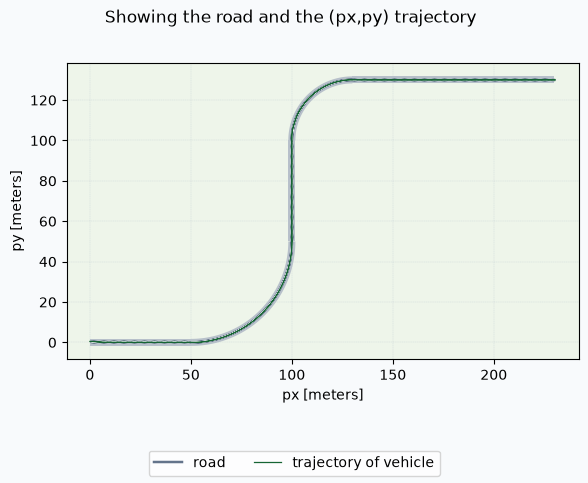

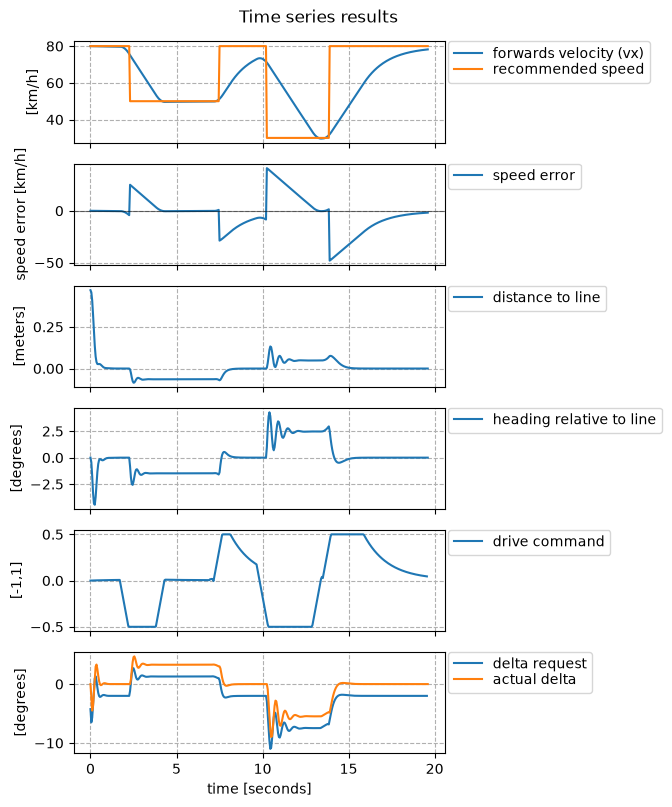

In [68]:
# SIMULATION SPECIFICATIONS
# ===================================
MPC_SIMULATION_STEPS = 500
MPC_SIMULATION_SEED = 20260810



# PARAMETER VALUES FOR THE MPC POLICY
# ===================================

# PREDICTION HORIZON
MPC_HORIZON_STEPS = 11

# CRUISE CONTROL PARAMETERS
MPC_SPEED_WEIGHT_QUADRATIC = 1 # 1
MPC_SPEED_WEIGHT_LINEAR = 0.0

MPC_DRIVE_COMMAND_WEIGHT_QUADRATIC = 42.0 # 10.0
MPC_DRIVE_COMMAND_WEIGHT_LINEAR = 0.0

MPC_DRIVE_COMMAND_LOWER = -0.5
MPC_DRIVE_COMMAND_UPPER =  0.5

MPC_DRIVE_RATE_LOWER = -0.05
MPC_DRIVE_RATE_UPPER =  0.05

MPC_SOFT_LINEAR_PENALTY = 20.0
MPC_SOFT_QUADRATIC_PENALTY = 1.0

# LANE KEEPING PARAMETERS
MPC_LATERAL_WEIGHT_QUADRATIC = 5.0 # 1.0
MPC_LATERAL_WEIGHT_LINEAR = 0.0 # 0.0

MPC_HEADING_WEIGHT_QUADRATIC = 1.0 # 0.1
MPC_HEADING_WEIGHT_LINEAR = 0.0

MPC_STEERING_ANGLE_WEIGHT_QUADRATIC = 3.0 # 0.1
MPC_STEERING_ANGLE_WEIGHT_LINEAR = 0.0

MPC_STEERING_RATE_WEIGHT_QUADRATIC = 0.1
MPC_STEERING_RATE_WEIGHT_LINEAR = 0.0



# CREATE THE MPC SOLVER OBJECT AND MPC POLICY
# ===========================================

try:
    nominal_model = KinematicBicycleMPCModelConfig.from_env(env)
    teaching_config = AutonomousDrivingSteeringRateMPCConfig.teaching_baseline(
        horizon_steps=MPC_HORIZON_STEPS,
        model=nominal_model,
        objective=SteeringRateMPCObjectiveConfig(
            speed_state_quadratic_weight=MPC_SPEED_WEIGHT_QUADRATIC,
            speed_state_linear_weight=MPC_SPEED_WEIGHT_LINEAR,
            lateral_error_state_quadratic_weight=MPC_LATERAL_WEIGHT_QUADRATIC,
            lateral_error_state_linear_weight=MPC_LATERAL_WEIGHT_LINEAR,
            heading_error_state_quadratic_weight=MPC_HEADING_WEIGHT_QUADRATIC,
            heading_error_state_linear_weight=MPC_HEADING_WEIGHT_LINEAR,
            steering_angle_state_quadratic_weight=MPC_STEERING_ANGLE_WEIGHT_QUADRATIC,
            steering_angle_state_linear_weight=MPC_STEERING_ANGLE_WEIGHT_LINEAR,
            normalized_drive_command_control_quadratic_weight=MPC_DRIVE_COMMAND_WEIGHT_QUADRATIC,
            normalized_drive_command_control_linear_weight=MPC_DRIVE_COMMAND_WEIGHT_LINEAR,
            steering_rate_control_quadratic_weight=MPC_STEERING_RATE_WEIGHT_QUADRATIC,
            steering_rate_control_linear_weight=MPC_STEERING_RATE_WEIGHT_LINEAR
        ),
        constraints=SteeringRateMPCConstraintConfig(
            normalized_drive_command_control_lower=MPC_DRIVE_COMMAND_LOWER,
            normalized_drive_command_control_upper=MPC_DRIVE_COMMAND_UPPER,
            normalized_drive_command_control_change_lower_per_step=MPC_DRIVE_RATE_LOWER,
            normalized_drive_command_control_change_upper_per_step=MPC_DRIVE_RATE_UPPER,
            soft_speed_state_lower_mps=0.0,
            recommended_speed_soft_upper_margin_mps=0.0,
            soft_lateral_error_state_lower_metres=None,
            soft_lateral_error_state_upper_metres=None,
            soft_heading_error_state_lower_radians=None,
            soft_heading_error_state_upper_radians=None,
            soft_state_linear_penalty=MPC_SOFT_LINEAR_PENALTY,
            soft_state_quadratic_penalty=MPC_SOFT_QUADRATIC_PENALTY,
        ),
        solver=MPCSolverConfig(
            verbose=False,
            absolute_tolerance=1.0e-3,
            relative_tolerance=1.0e-8,
            polishing=True,
        ),
        fallback=MPCFallbackConfig(mode=MPCFallbackMode.HOLD_PREVIOUS_ACTION),
    )
    policy = AutonomousDrivingSteeringRateMPCPolicy.from_env(
        env,
        teaching_config,
    )
except Exception:
    env.close()
    raise



# SIMULATE THE MPC POLICY AND PLOT THE RESULTS
# ============================================
try:
    mpc_history = simulate_mpc_policy(
        env,
        MPC_SIMULATION_STEPS,
        policy,
        seed=MPC_SIMULATION_SEED,
        capture_world_predictions=True,
    )

    mpc_animation_road = env.unwrapped.road
    mpc_animation_car = env.unwrapped.car

    mpc_figures = plot_simulation_results(
        env,
        mpc_history.simulation_time_series,
        should_plot_reward=False,
        should_plot_speed_error=True,
    )

    trajectory_figure = mpc_figures["cartesian_coords"]
    time_series_figure = mpc_figures["time_series"]

    plt.show()

finally:
    env.close()

### **Your turn**

* Spend your time adjusting the parameters of the MPC policy, which are defined at the start of this code block and describe above.
* **The goal** is that you decide on a handful of "key" MPC policy parameters that you will adjust for the perofrmance evaluation comparing multiple MPC policies, i.e., **the goal** is for you to observe which MPC policy parameters have the biggest influence on what you define a "good" system behaviour.
* The MPC policy takes a moderate amount of time to run (though much faster than Deep RL, MPC is slow enough to be tedious). Hence, you should consider:
  * Start your testing with shorter simulations (e.g., `N_sim=500`).
  * Change the road multiple times to put different features towards the start of the road, which allows you to oberseve the performance on this feature with a short simulation.

### Animate the MPC predictions

These animation can provide some visual insight into what the MPC policy is "doing".

In [57]:
# PLOT ANIMATION OF CAR DRIVING ON ROAD
# =====================================
mpc_world_figure, mpc_world_axis = plt.subplots(figsize=(9.0, 6.0))

mpc_world_animation = animate_mpc_world_prediction_history(
    mpc_history,
    zoom_mode="follow",
    zoom_width_m=50.0,
    zoom_height_m=50.0,
    vehicle=mpc_animation_car,
    road=mpc_animation_road,
    ax=mpc_world_axis,
    frame_step=MODE["animation_frame_step"],
    display_units="driving",
    figure_title="MPC prediction in road space",
    show_predicted_headings=False,
)

display(HTML(mpc_world_animation.to_jshtml(default_mode="loop")))
plt.close(mpc_world_figure)



# PLOT ANIMATION OF TIME SERIES
# =============================
# mpc_prediction_animation = animate_mpc_prediction_history(
#     mpc_history,
#     frame_step=MODE["animation_frame_step"],
#     display_units="driving",
# )

# animation_figure = plt.gcf()
# display(HTML(mpc_prediction_animation.to_jshtml(default_mode="loop")))
# plt.close(animation_figure)

### Plot full suite of MPC diagnostic figures

As a base case you do **NOT** to look at any of these figures. The code is included in this notebook so that you have it readily available to you if you do decided to dig deeper into some aspect of the MPC policy.

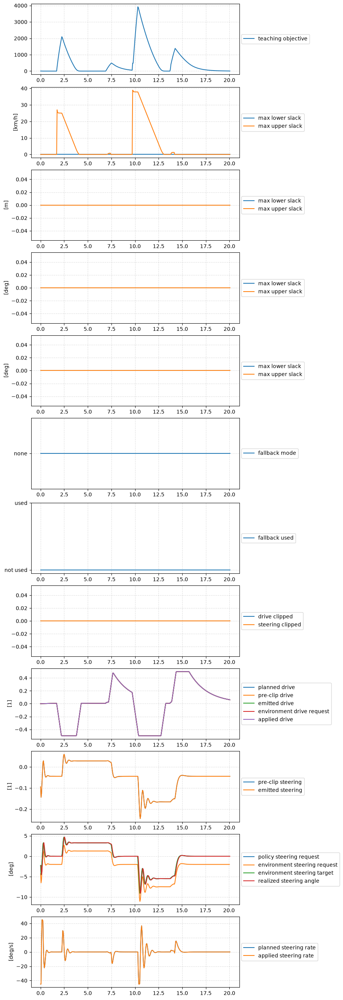

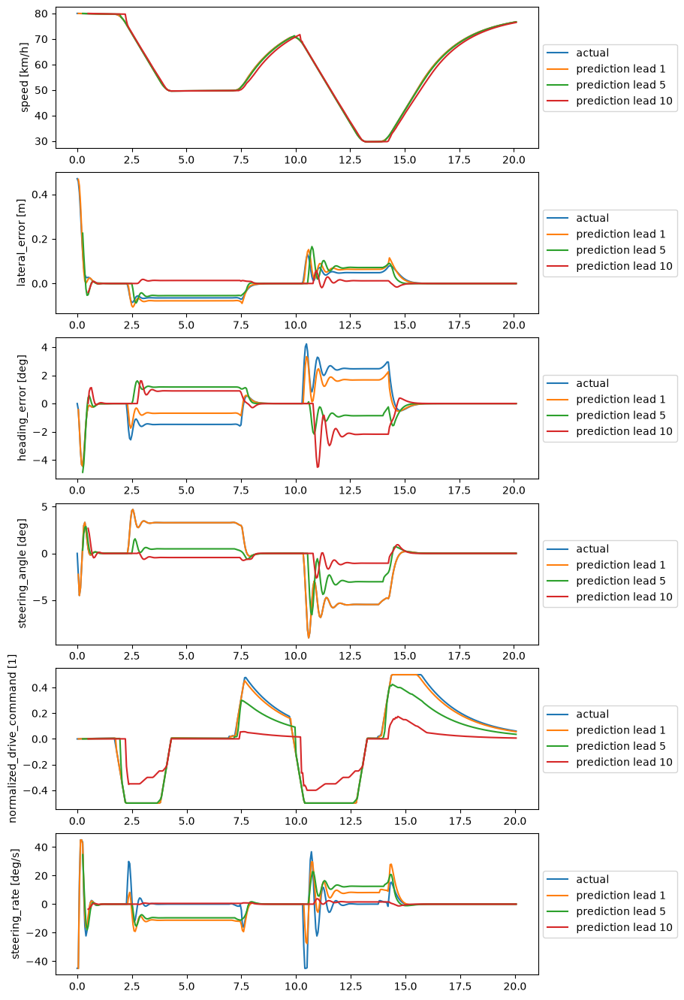

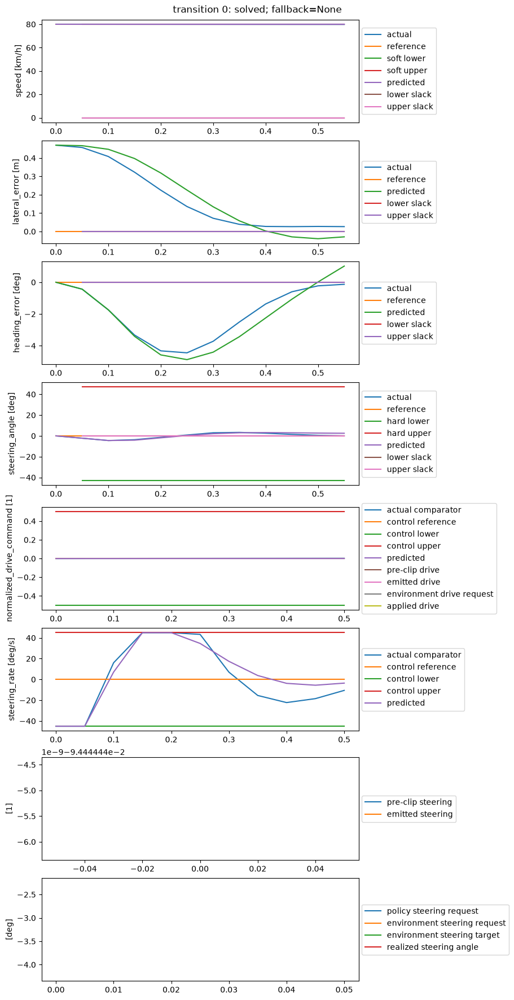

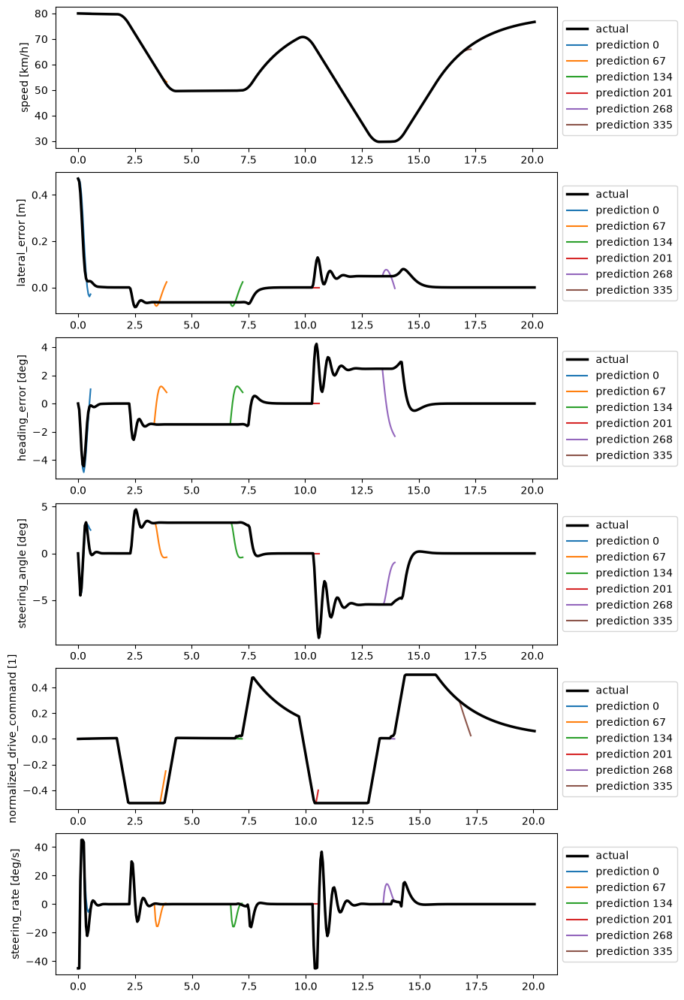

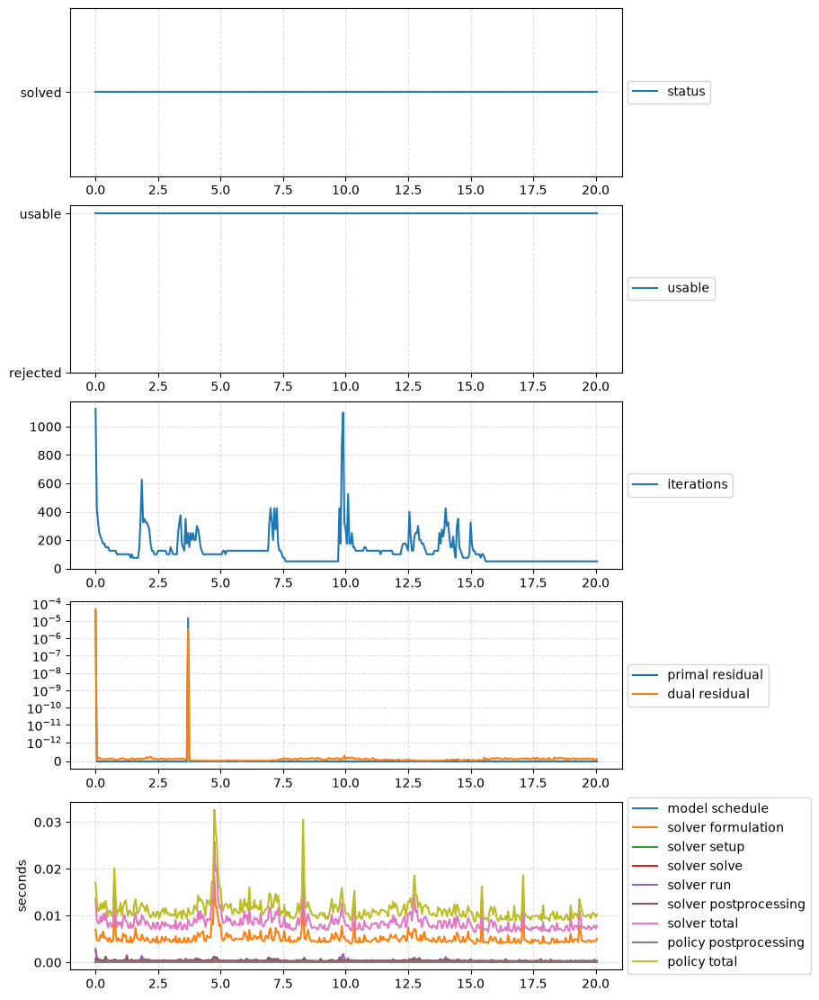

In [58]:
import matplotlib.pyplot as plt

# selected_transition_index identifies one closed-loop simulation step whose
# MPC prediction we want to inspect. This code simply selects the first
# transition that produced a usable MPC solution
selected_transition_index = next(
    record.transition_index
    for record in mpc_history.records
    if record.solve_usable
)

nominal_figures = {}
plot_figure_numbers_before = set(plt.get_fignums())
try:
    nominal_figures["controller_outcomes"] = plot_mpc_controller_outcomes(mpc_history)[0]
    nominal_figures["fixed_lead_predictions"] = plot_mpc_fixed_lead_predictions(mpc_history)[0]
    nominal_figures["prediction_at_transition"] = plot_mpc_prediction_at_transition(
        mpc_history, selected_transition_index,
    )[0]
    nominal_figures["prediction_horizon_fan"] = plot_mpc_prediction_horizon_fan(
        mpc_history, prediction_stride=max(1, mpc_history.transition_count // 6),
    )[0]
    nominal_figures["solver_health"] = plot_mpc_solver_health(mpc_history)[0]

    save_figure(nominal_figures["controller_outcomes"], OUTPUT_ROOT / "nominal_controller_outcomes.png")
    save_figure(nominal_figures["fixed_lead_predictions"], OUTPUT_ROOT / "nominal_fixed_lead_predictions.png")
    save_figure(nominal_figures["prediction_at_transition"], OUTPUT_ROOT / "nominal_prediction_at_transition.png")
    save_figure(nominal_figures["prediction_horizon_fan"], OUTPUT_ROOT / "nominal_prediction_horizon_fan.png")
    save_figure(nominal_figures["solver_health"], OUTPUT_ROOT / "nominal_solver_health.png")

    for figure in nominal_figures.values():
        display(figure)
finally:
    for figure in nominal_figures.values():
        plt.close(figure)
    for figure_number in set(plt.get_fignums()) - plot_figure_numbers_before:
        plt.close(figure_number)


## 4. Evaluation

This section reuses the performance metrics and uncertainty sweep APIs covered in the respective notebook to eveluate and compare multiple MPC policies with different paramters.

### Evaluation seed and lengths

In [59]:
MPC_EVALUATION_SEED = 20260810

MPC_EVALUATION_MODE = {
    "smoke": {"sweep_samples": 2, "sweep_steps": 20},
    "full":  {"sweep_samples": 8, "sweep_steps": 1000},
}[RUN_MODE]

### Evaluation road specification

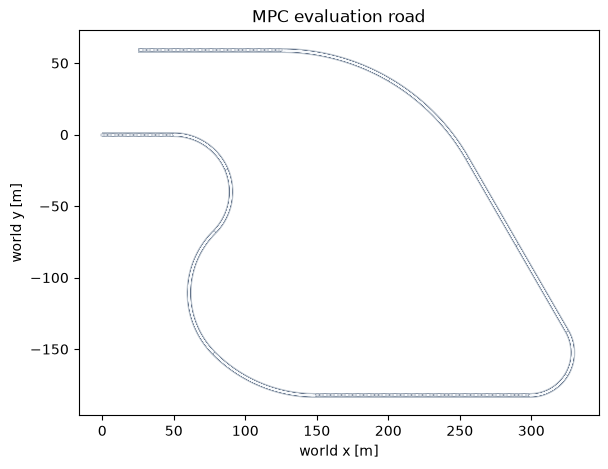

In [60]:
MPC_EVALUATION_ROAD_ELEMENTS = (
    {
        "geometry": {"type": "straight", "length_m": 50.0},
        "speed_limit_kph": 80.0,
        "lanes": {
            "reference_line_role": "lane_center",
            "reference_lane": {"width_m": {"start": 3.5, "end": 3.5}},
        },
    },
    {"speed_limit_kph":  80.0, "geometry": {"type": "circular_arc", "curvature_per_m": -1.0 / 40.0, "sweep_angle_deg": 135.0}},
    {"speed_limit_kph":  80.0, "geometry": {"type": "circular_arc", "curvature_per_m":  1.0 / 60.0, "sweep_angle_deg": 90.0}},
    {"speed_limit_kph":  80.0, "geometry": {"type": "circular_arc", "curvature_per_m":  1.0 / 100.0, "sweep_angle_deg": 45.0}},
    {"speed_limit_kph":  80.0, "geometry": {"type": "straight", "length_m": 150.0}},
    {"speed_limit_kph":  80.0, "geometry": {"type": "circular_arc", "curvature_per_m": 1.0 / 30.0, "sweep_angle_deg": 120.0}},
    {"speed_limit_kph":  80.0, "geometry": {"type": "straight", "length_m": 70.0}},
    {"speed_limit_kph":  50.0, "geometry": {"type": "straight", "length_m": 70.0}},
    {"speed_limit_kph":  50.0, "geometry": {"type": "circular_arc", "curvature_per_m": 1.0 / 150.0, "sweep_angle_deg": 30.0}},
    {"speed_limit_kph": 100.0, "geometry": {"type": "circular_arc", "curvature_per_m": 1.0 / 150.0, "sweep_angle_deg": 30.0}},
    {"speed_limit_kph": 100.0, "geometry": {"type": "straight", "length_m": 100.0}},
)

MPC_EVALUATION_ROAD_SPEC = build_mpc_road_spec(
    MPC_EVALUATION_ROAD_ELEMENTS
)
mpc_evaluation_road = Road(road_spec=MPC_EVALUATION_ROAD_SPEC)

evaluation_road_figure, evaluation_road_axis = plt.subplots(
    figsize=(8.0, 5.0)
)
evaluation_road_plot_handles = (
    mpc_evaluation_road.plot_road_on_matplotlib_axis(
        evaluation_road_axis
    )
)
evaluation_road_axis.set_title("MPC evaluation road")
evaluation_road_axis.set_xlabel("world x [m]")
evaluation_road_axis.set_ylabel("world y [m]")
evaluation_road_axis.set_aspect("equal", adjustable="box")

try:
    display(evaluation_road_figure)
    evaluation_road_plot_path = save_road_plot(
        evaluation_road_figure,
        OUTPUT_ROOT,
        file_name_suffix="evaluation-road",
        file_format="png",
    )
finally:
    plt.close(evaluation_road_figure)

### Your turn

Add, remove, and/or edit the roads elements in `MPC_EVALUATION_ROAD_ELEMENTS` above to specify the road you want to for evaluation.

### Make the evaluation environment

In [61]:
if "road_spec" in mpc_common_environment_kwargs:
    raise RuntimeError(
        "mpc_common_environment_kwargs must omit the road specification"
    )

MPC_EVALUATION_ENVIRONMENT_KWARGS = copy.deepcopy(
    mpc_common_environment_kwargs
)
MPC_EVALUATION_ENVIRONMENT_KWARGS["road_spec"] = copy.deepcopy(
    mpc_evaluation_road.requested_road_spec
)
MPC_EVALUATION_ENVIRONMENT_KWARGS["observation_config"][
    "lateral_error_from_target_line_m"
]["noise_standard_deviation_m"] = 0.0
MPC_EVALUATION_ENVIRONMENT_KWARGS["observation_config"][
    "fixed_noise_seed"
] = MPC_EVALUATION_SEED

### Define the MPC policies to compare

In [62]:
# As the notebook is provided, each candidate MPC policies currently changes
# only the preduction horizon length.
#
# To vary other parameters, add fields to objective_overrides or constraint_overrides.
#
# Examples:
# "objective_overrides": {
#     "lateral_error_state_quadratic_weight": 4.0,
# }
#
# "constraint_overrides": {
#     "normalized_drive_command_control_change_lower_per_step": -0.025,
#     "normalized_drive_command_control_change_upper_per_step": 0.025,
# }

MPC_EVALUATION_CANDIDATE_DEFINITIONS = (
    {
        "name": "horizon-10",
        "horizon_steps": 10,
        "objective_overrides": {},
        "constraint_overrides": {},
    },
    {
        "name": "horizon-30",
        "horizon_steps": 30,
        "objective_overrides": {},
        "constraint_overrides": {},
    },
    {
        "name": "horizon-50",
        "horizon_steps": 50,
        "objective_overrides": {},
        "constraint_overrides": {},
    },
)


def build_mpc_evaluation_candidate_config(candidate_definition):
    return dataclasses.replace(
        teaching_config,
        horizon_steps=int(candidate_definition["horizon_steps"]),
        objective=dataclasses.replace(
            teaching_config.objective,
            **candidate_definition["objective_overrides"],
        ),
        constraints=dataclasses.replace(
            teaching_config.constraints,
            **candidate_definition["constraint_overrides"],
        ),
    )


MPC_EVALUATION_CANDIDATE_CONFIGS = tuple(
    (
        definition["name"],
        build_mpc_evaluation_candidate_config(definition),
    )
    for definition in MPC_EVALUATION_CANDIDATE_DEFINITIONS
)

candidate_names = tuple(
    name for name, _ in MPC_EVALUATION_CANDIDATE_CONFIGS
)
if len(candidate_names) != len(set(candidate_names)):
    raise RuntimeError("MPC evaluation candidate names must be unique")


def build_mpc_evaluation_policy_specs(candidate_configs):
    binding_environment = gym.make(
        "dreamgym/autonomous_driving_env",
        **copy.deepcopy(MPC_EVALUATION_ENVIRONMENT_KWARGS),
    )

    try:
        return tuple(
            PolicySpec(
                name=name,
                policy=AutonomousDrivingSteeringRateMPCPolicy.from_env(
                    binding_environment,
                    candidate_config,
                ),
            )
            for name, candidate_config in candidate_configs
        )
    finally:
        binding_environment.close()


MPC_EVALUATION_POLICY_SPECS = build_mpc_evaluation_policy_specs(
    MPC_EVALUATION_CANDIDATE_CONFIGS
)

mpc_evaluation_candidate_rows = [
    {
        "policy_name": name,
        "horizon_steps": config.horizon_steps,
        "speed_weight": config.objective.speed_state_quadratic_weight,
        "lateral_error_weight": (
            config.objective.lateral_error_state_quadratic_weight
        ),
        "heading_error_weight": (
            config.objective.heading_error_state_quadratic_weight
        ),
        "steering_angle_weight": (
            config.objective.steering_angle_state_quadratic_weight
        ),
        "drive_command_weight": (
            config.objective
            .normalized_drive_command_control_quadratic_weight
        ),
        "steering_rate_weight": (
            config.objective.steering_rate_control_quadratic_weight
        ),
        "soft_state_linear_penalty": (
            config.constraints.soft_state_linear_penalty
        ),
        "soft_state_quadratic_penalty": (
            config.constraints.soft_state_quadratic_penalty
        ),
    }
    for name, config in MPC_EVALUATION_CANDIDATE_CONFIGS
]

display(mpc_evaluation_candidate_rows)

[{'policy_name': 'horizon-10',
  'horizon_steps': 10,
  'speed_weight': 0.7,
  'lateral_error_weight': 5.0,
  'heading_error_weight': 1.0,
  'steering_angle_weight': 3.0,
  'drive_command_weight': 42.0,
  'steering_rate_weight': 0.1,
  'soft_state_linear_penalty': 20.0,
  'soft_state_quadratic_penalty': 1.0},
 {'policy_name': 'horizon-30',
  'horizon_steps': 30,
  'speed_weight': 0.7,
  'lateral_error_weight': 5.0,
  'heading_error_weight': 1.0,
  'steering_angle_weight': 3.0,
  'drive_command_weight': 42.0,
  'steering_rate_weight': 0.1,
  'soft_state_linear_penalty': 20.0,
  'soft_state_quadratic_penalty': 1.0},
 {'policy_name': 'horizon-50',
  'horizon_steps': 50,
  'speed_weight': 0.7,
  'lateral_error_weight': 5.0,
  'heading_error_weight': 1.0,
  'steering_angle_weight': 3.0,
  'drive_command_weight': 42.0,
  'steering_rate_weight': 0.1,
  'soft_state_linear_penalty': 20.0,
  'soft_state_quadratic_penalty': 1.0}]

### Your turn

Edit the `MPC_EVALUATION_CANDIDATE_DEFINITIONS` in the previous code cell to specify the set of MPC policies that you want to compare.

### Performance metrics definition

As the notebook is provided, the performance metric here are the same as in the respective notebook.

In [63]:
MPC_EVALUATION_BUILT_IN_METRIC_NAMES = (
    "mean_abs_lateral_error_m",
    "mean_abs_speed_error_to_recommended_kph",
)
mpc_evaluation_built_in_metrics = tuple(
    metric_by_name(name)
    for name in MPC_EVALUATION_BUILT_IN_METRIC_NAMES
)

MPC_EVALUATION_LATERAL_TOLERANCE_M = 0.75


def fraction_outside_mpc_evaluation_lateral_tolerance(time_series):
    lateral_error_m = np.asarray(
        time_series["lateral_error_from_target_line"],
        dtype=np.float64,
    ).reshape(-1)

    finite_lateral_error_m = lateral_error_m[
        np.isfinite(lateral_error_m)
    ]

    if finite_lateral_error_m.size == 0:
        return float("nan")

    return float(
        np.mean(
            np.abs(finite_lateral_error_m)
            > MPC_EVALUATION_LATERAL_TOLERANCE_M
        )
    )


mpc_evaluation_fraction_outside_lateral_tolerance_metric = (
    PerformanceMetric(
        name="fraction_outside_lateral_tolerance",
        display_name="Fraction outside lateral tolerance",
        unit="fraction",
        direction="smaller",
        requirement_group="lane_keeping",
        required_fields=("lateral_error_from_target_line",),
        equation=(
            "count(abs(finite lateral_error_from_target_line) > "
            "lateral_tolerance_m) / count(finite samples)"
        ),
        description=(
            "Fraction of finite rollout samples beyond the editable "
            "absolute lateral-error tolerance."
        ),
        justification=(
            "Separates persistent lane-margin excursions from the "
            "average-error magnitude."
        ),
        function=fraction_outside_mpc_evaluation_lateral_tolerance,
        primary_aggregate="mean",
    )
)

MPC_EVALUATION_METRICS = MetricSet(
    (
        *mpc_evaluation_built_in_metrics,
        mpc_evaluation_fraction_outside_lateral_tolerance_metric,
    )
)
MPC_EVALUATION_METRIC_NAMES = tuple(
    metric.name for metric in MPC_EVALUATION_METRICS
)

### Uncertainty sweep definition

In [64]:
MPC_EVALUATION_UNCERTAINTY_PARAMETERS = (
    UniformMultiplierParameter(
        name="mass_multiplier",
        path=(
            "bicycle_model_config",
            "mass_properties",
            "mass_kg",
        ),
        low=0.95,
        high=1.05,
    ),
    InitialStateValueParameter(
        name="initial_world_position_y_m",
        path=("world_pose", "y_m"),
        low=-0.25,
        high=0.25,
    ),
)

mpc_evaluation_sweep = UncertaintySweep.monte_carlo(
    MPC_EVALUATION_UNCERTAINTY_PARAMETERS,
    samples=MPC_EVALUATION_MODE["sweep_samples"],
    seed=MPC_EVALUATION_SEED,
)

mpc_evaluation_config = AutonomousDrivingEvaluationConfig(
    n_steps=MPC_EVALUATION_MODE["sweep_steps"],
    base_env_kwargs=MPC_EVALUATION_ENVIRONMENT_KWARGS,
    include_look_ahead_results=False,
    include_observations=False,
    verbose=0,
)

### Run the uncertainty sweep

In [65]:
mpc_evaluation_results = evaluate_policies_over_sweep(
    policies=MPC_EVALUATION_POLICY_SPECS,
    config=mpc_evaluation_config,
    metrics=MPC_EVALUATION_METRICS,
    sweep=mpc_evaluation_sweep,
    include_per_rollout_metrics=True,
)

mpc_evaluation_metric_table_paths = save_metric_tables(
    mpc_evaluation_results,
    OUTPUT_ROOT,
    file_prefix="mpc_horizon_uncertainty",
    metrics=MPC_EVALUATION_METRICS,
)

#display(mpc_evaluation_results.aggregate_rows)

### Display some evaluation results

In [66]:
# Require unflagged, contributing, finite results for Pareto eligibility.
mpc_evaluation_eligibility_rows = []
mpc_evaluation_eligible_aggregate_rows = []

for aggregate_row in mpc_evaluation_results.aggregate_rows:
    ineligibility_reasons = []

    if int(aggregate_row["flagged_rollout_count"]) != 0:
        ineligibility_reasons.append("flagged_rollouts")

    if int(aggregate_row["metric_rollout_count"]) <= 0:
        ineligibility_reasons.append("zero_contributing_rollouts")

    if any(
        not np.isfinite(
            float(aggregate_row[metric_name + "__primary"])
        )
        for metric_name in MPC_EVALUATION_METRIC_NAMES
    ):
        ineligibility_reasons.append("nonfinite_primary_metric")

    eligible = not ineligibility_reasons

    mpc_evaluation_eligibility_rows.append(
        {
            "policy_name": str(aggregate_row["policy_name"]),
            "eligible": eligible,
            "ineligibility_reasons": tuple(ineligibility_reasons),
        }
    )

    if eligible:
        mpc_evaluation_eligible_aggregate_rows.append(
            aggregate_row
        )


if len(mpc_evaluation_eligible_aggregate_rows) >= 2:
    mpc_evaluation_pareto_rows = compute_pareto_front(
        mpc_evaluation_eligible_aggregate_rows,
        MPC_EVALUATION_METRICS,
        metric_names=MPC_EVALUATION_METRIC_NAMES,
    )
else:
    mpc_evaluation_pareto_rows = ()
    print(
        "Pareto membership was not computed because fewer than two "
        "policies were eligible."
    )


pareto_row_by_policy_name = {
    str(row["policy_name"]): row
    for row in mpc_evaluation_pareto_rows
}
aggregate_row_by_policy_name = {
    str(row["policy_name"]): row
    for row in mpc_evaluation_results.aggregate_rows
}

mpc_evaluation_pareto_information = []

for eligibility_row in mpc_evaluation_eligibility_rows:
    policy_name = eligibility_row["policy_name"]
    aggregate_row = aggregate_row_by_policy_name[policy_name]
    pareto_row = pareto_row_by_policy_name.get(policy_name)

    if not eligibility_row["eligible"]:
        pareto_status = "ineligible"
    elif pareto_row is None:
        pareto_status = "not_computed"
    else:
        pareto_status = pareto_row["pareto_status"]

    mpc_evaluation_pareto_information.append(
        {
            "policy_name": policy_name,
            **{
                metric_name: float(
                    aggregate_row[metric_name + "__primary"]
                )
                for metric_name in MPC_EVALUATION_METRIC_NAMES
            },
            "eligible": eligibility_row["eligible"],
            "ineligibility_reasons": (
                eligibility_row["ineligibility_reasons"]
            ),
            "pareto_status": pareto_status,
            "is_pareto_front": (
                False
                if pareto_row is None
                else bool(pareto_row["is_pareto_front"])
            ),
            "dominated_by": (
                []
                if pareto_row is None
                else list(pareto_row["dominated_by"])
            ),
            "dominates": (
                []
                if pareto_row is None
                else list(pareto_row["dominates"])
            ),
        }
    )

display(mpc_evaluation_eligibility_rows)
display(mpc_evaluation_pareto_information)

[{'policy_name': 'horizon-10', 'eligible': True, 'ineligibility_reasons': ()},
 {'policy_name': 'horizon-30', 'eligible': True, 'ineligibility_reasons': ()},
 {'policy_name': 'horizon-50', 'eligible': True, 'ineligibility_reasons': ()}]

[{'policy_name': 'horizon-10',
  'mean_abs_lateral_error_m': 0.030491379156548898,
  'mean_abs_speed_error_to_recommended_kph': 6.837758919051835,
  'fraction_outside_lateral_tolerance': 0.0,
  'eligible': True,
  'ineligibility_reasons': (),
  'pareto_status': 'dominated',
  'is_pareto_front': False,
  'dominated_by': ['horizon-30', 'horizon-50'],
  'dominates': []},
 {'policy_name': 'horizon-30',
  'mean_abs_lateral_error_m': 0.02984965751976874,
  'mean_abs_speed_error_to_recommended_kph': 4.228672144201015,
  'fraction_outside_lateral_tolerance': 0.0,
  'eligible': True,
  'ineligibility_reasons': (),
  'pareto_status': 'front',
  'is_pareto_front': True,
  'dominated_by': [],
  'dominates': ['horizon-10', 'horizon-50']},
 {'policy_name': 'horizon-50',
  'mean_abs_lateral_error_m': 0.02995008748446769,
  'mean_abs_speed_error_to_recommended_kph': 4.2913404593339095,
  'fraction_outside_lateral_tolerance': 0.0,
  'eligible': True,
  'ineligibility_reasons': (),
  'pareto_status': 'd

### Tabulate and plot some evaluation results

This is an example of manually created tables and plots (as opposed to using the visualization functions built into the Gymnasium).

| Policy | Horizon | Used/total rollouts | Mean absolute lateral error [m]<br>mean [95% CI] | Mean absolute speed error [km/h]<br>mean [95% CI] | Fraction outside lateral tolerance [fraction]<br>mean [95% CI] | Pareto status |
| --- | ---: | ---: | ---: | ---: | ---: | --- |
| horizon-10 | 10 | 8/8 (0 flagged) | 0.030 [0.030, 0.031] | 6.84 [6.71, 6.97] | 0.000 [0.000, 0.000] | dominated |
| horizon-30 | 30 | 8/8 (0 flagged) | 0.030 [0.030, 0.030] | 4.23 [4.15, 4.31] | 0.000 [0.000, 0.000] | front |
| horizon-50 | 50 | 8/8 (0 flagged) | 0.030 [0.030, 0.030] | 4.29 [4.26, 4.32] | 0.000 [0.000, 0.000] | dominated |

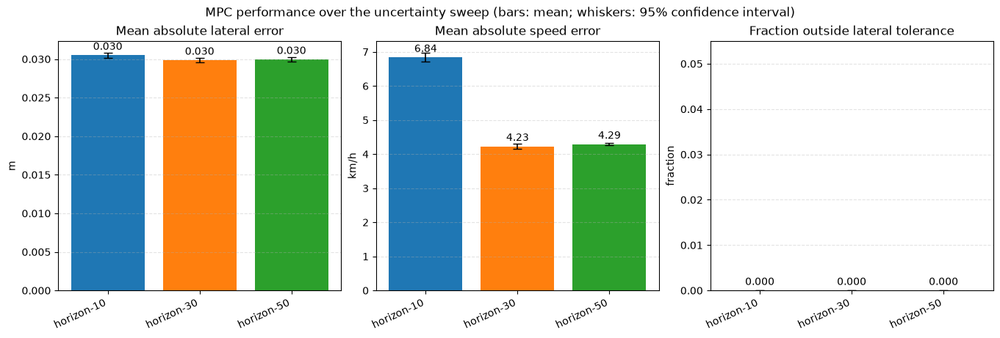

In [67]:
# COMPACT MPC EVALUATION SUMMARY

import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Markdown, display

from dreamgym.visualization.autonomous_driving import save_figure


MPC_EVALUATION_SUMMARY_METRICS = (
    {
        "name": "mean_abs_lateral_error_m",
        "label": "Mean absolute lateral error",
        "unit": "m",
        "decimals": 3,
    },
    {
        "name": "mean_abs_speed_error_to_recommended_kph",
        "label": "Mean absolute speed error",
        "unit": "km/h",
        "decimals": 2,
    },
    {
        "name": "fraction_outside_lateral_tolerance",
        "label": "Fraction outside lateral tolerance",
        "unit": "fraction",
        "decimals": 3,
    },
)


def build_mpc_evaluation_summary_rows(
    aggregate_rows,
    candidate_configs,
    pareto_information,
    metric_specs,
):
    aggregate_by_policy = {
        str(row["policy_name"]): row
        for row in aggregate_rows
    }
    pareto_by_policy = {
        str(row["policy_name"]): row
        for row in pareto_information
    }

    summary_rows = []

    for policy_name, candidate_config in candidate_configs:
        policy_name = str(policy_name)
        aggregate_row = aggregate_by_policy[policy_name]

        summary_row = {
            "policy_name": policy_name,
            "horizon_steps": int(candidate_config.horizon_steps),
            "rollout_count": int(aggregate_row["rollout_count"]),
            "metric_rollout_count": int(
                aggregate_row["metric_rollout_count"]
            ),
            "flagged_rollout_count": int(
                aggregate_row["flagged_rollout_count"]
            ),
            "pareto_status": str(
                pareto_by_policy[policy_name]["pareto_status"]
            ),
        }

        summary_row["rollout_summary"] = (
            f'{summary_row["metric_rollout_count"]}/'
            f'{summary_row["rollout_count"]} '
            f'({summary_row["flagged_rollout_count"]} flagged)'
        )

        for metric_spec in metric_specs:
            metric_name = metric_spec["name"]

            summary_row[metric_name] = float(
                aggregate_row[metric_name + "__primary"]
            )
            summary_row[metric_name + "__ci95_low"] = float(
                aggregate_row[metric_name + "__ci95_low"]
            )
            summary_row[metric_name + "__ci95_high"] = float(
                aggregate_row[metric_name + "__ci95_high"]
            )

        summary_rows.append(summary_row)

    return summary_rows


def format_mpc_metric_with_confidence_interval(row, metric_spec):
    metric_name = metric_spec["name"]

    value = float(row[metric_name])
    lower = float(row[metric_name + "__ci95_low"])
    upper = float(row[metric_name + "__ci95_high"])

    if not np.all(np.isfinite((value, lower, upper))):
        return "not available"

    decimals = int(metric_spec["decimals"])

    return (
        f"{value:.{decimals}f} "
        f"[{lower:.{decimals}f}, {upper:.{decimals}f}]"
    )


def plot_mpc_evaluation_metric_summary(summary_rows, metric_specs):
    metric_count = len(metric_specs)

    figure, axes = plt.subplots(
        1,
        metric_count,
        figsize=(4.5 * metric_count, 4.5),
        constrained_layout=True,
        squeeze=False,
    )
    axes = axes[0]

    policy_names = [
        row["policy_name"]
        for row in summary_rows
    ]
    positions = np.arange(len(summary_rows))

    colors = [
        plt.get_cmap("tab10")(index % 10)
        for index in range(len(summary_rows))
    ]

    for axis, metric_spec in zip(axes, metric_specs):
        metric_name = metric_spec["name"]

        values = np.asarray(
            [row[metric_name] for row in summary_rows],
            dtype=np.float64,
        )
        confidence_interval_lower = np.asarray(
            [
                row[metric_name + "__ci95_low"]
                for row in summary_rows
            ],
            dtype=np.float64,
        )
        confidence_interval_upper = np.asarray(
            [
                row[metric_name + "__ci95_high"]
                for row in summary_rows
            ],
            dtype=np.float64,
        )

        finite = (
            np.isfinite(values)
            & np.isfinite(confidence_interval_lower)
            & np.isfinite(confidence_interval_upper)
        )

        bars = axis.bar(
            positions[finite],
            values[finite],
            color=[
                colors[index]
                for index in np.flatnonzero(finite)
            ],
        )

        axis.errorbar(
            positions[finite],
            values[finite],
            yerr=np.vstack(
                (
                    np.maximum(
                        0.0,
                        values[finite]
                        - confidence_interval_lower[finite],
                    ),
                    np.maximum(
                        0.0,
                        confidence_interval_upper[finite]
                        - values[finite],
                    ),
                )
            ),
            fmt="none",
            ecolor="black",
            capsize=4,
            linewidth=1.2,
        )

        axis.bar_label(
            bars,
            labels=[
                f'{value:.{metric_spec["decimals"]}f}'
                for value in values[finite]
            ],
            padding=3,
        )

        axis.set_title(metric_spec["label"])
        axis.set_ylabel(metric_spec["unit"])
        axis.set_xticks(
            positions,
            policy_names,
            rotation=25,
            ha="right",
        )
        axis.set_ylim(bottom=0.0)
        axis.grid(
            axis="y",
            linestyle="--",
            alpha=0.35,
        )

    figure.suptitle(
        "MPC performance over the uncertainty sweep "
        "(bars: mean; whiskers: 95% confidence interval)"
    )

    return figure


mpc_evaluation_summary_rows = build_mpc_evaluation_summary_rows(
    mpc_evaluation_results.aggregate_rows,
    MPC_EVALUATION_CANDIDATE_CONFIGS,
    mpc_evaluation_pareto_information,
    MPC_EVALUATION_SUMMARY_METRICS,
)


table_headers = [
    "Policy",
    "Horizon",
    "Used/total rollouts",
    *[
        (
            f'{metric_spec["label"]} '
            f'[{metric_spec["unit"]}]<br>'
            "mean [95% CI]"
        )
        for metric_spec in MPC_EVALUATION_SUMMARY_METRICS
    ],
    "Pareto status",
]

table_alignment = [
    "---",
    "---:",
    "---:",
    *["---:" for _ in MPC_EVALUATION_SUMMARY_METRICS],
    "---",
]

table_lines = [
    "| " + " | ".join(table_headers) + " |",
    "| " + " | ".join(table_alignment) + " |",
]

for summary_row in mpc_evaluation_summary_rows:
    table_values = [
        summary_row["policy_name"],
        str(summary_row["horizon_steps"]),
        summary_row["rollout_summary"],
        *[
            format_mpc_metric_with_confidence_interval(
                summary_row,
                metric_spec,
            )
            for metric_spec in MPC_EVALUATION_SUMMARY_METRICS
        ],
        summary_row["pareto_status"].replace("_", " "),
    ]

    table_lines.append(
        "| "
        + " | ".join(
            str(value).replace("|", "\\|")
            for value in table_values
        )
        + " |"
    )


display(Markdown("\n".join(table_lines)))


mpc_evaluation_summary_figure = (
    plot_mpc_evaluation_metric_summary(
        mpc_evaluation_summary_rows,
        MPC_EVALUATION_SUMMARY_METRICS,
    )
)

try:
    display(mpc_evaluation_summary_figure)

    mpc_evaluation_summary_figure_path = save_figure(
        mpc_evaluation_summary_figure,
        OUTPUT_ROOT / "mpc_evaluation_metric_summary.png",
    )
finally:
    plt.close(mpc_evaluation_summary_figure)

### Your turn

Perform the analysis that you want to perform by editing the set of MPC policies, the evaluation road, the performance metrics, the uncertainty sweeps, the tabulation & plotting of the results, and anything else.